# Salient Object Detection (SOD) - how to remove background from whales images

Salient Object Detection (SOD) aims at segmenting the most visually attractive objects in an image. It is widely
used in many fields, such as visual tracking and image segmentation. Recently, with the development of deep convolutional neural networks (CNNs), especially the rise of Fully Convolutional Networks (FCN) in image segmentation, the salient object detection has been improved significantly. (Source: https://arxiv.org/pdf/2005.09007.pdf)

During my reearch I found SOD survey [RGB-D Salient Object Detection: A Survey](https://github.com/taozh2017/RGBD-SODsurvey). This is a survey to review related RGB-D SOD models along with benchmark datasets, and provide a comprehensive evaluation for these models. Authors also collect related review papers for SOD and light field SOD models.

<div align="center"><img src="https://github.com/taozh2017/RGBD-SODsurvey/raw/master/figures/Fig0.jpg" width=640/></div>
In this experiment I use U2-Net: U Square Net whis is described in <a href="https://arxiv.org/pdf/2005.09007.pdf">U2-Net: Going Deeper with Nested U-Structure for Salient Object Detection</a>
<p>&nbsp;</p>
U2-Net Architecture:
<div align="center"><img src="https://github.com/xuebinqin/U-2-Net/raw/master/figures/U2NETPR.png" width=480/></div>

I use this for solution with LoFTR features matching which you can see in my notebook [Whales feature matching LoFTR - Kornia](https://www.kaggle.com/remekkinas/whales-feature-matching-loftr-kornia) 
    
<div align="center"><img src="https://i.ibb.co/yQzhzb8/Lo-FTR-BR1.jpg"/></div>

<div class="alert alert-warning">Note: My goal was to implement and share tool for experimentations  - I was not creating full dataset using this. This is part of your journey. Enjoy experimenting and progressing!</div>

## 1. SETUP NOTEBOOK (MODULES)
Let's clone U-2-Net repository

In [38]:
!git clone https://github.com/shreyas-bk/U-2-Net
    
import sys
sys.path.append('./U-2-Net')

fatal: destination path 'U-2-Net' already exists and is not an empty directory.


In [39]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from data_loader import RescaleT
from data_loader import ToTensor
from data_loader import ToTensorLab
from data_loader import SalObjDataset
from model import U2NET 
from model import U2NETP 

from IPython.display import display
from PIL import Image as Img

from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable

import os, json, random, cv2
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf, re, math
from tqdm import tqdm
from tqdm import tqdm

In [59]:
%%time

### Create Kaggle Dataset if not exists 

DATASET_NAME = f'backfin_seg'

# !rm -r /tmp/{DATASET_NAME}

os.makedirs(f'/tmp/{DATASET_NAME}', exist_ok=True)

# with open('../input/d/jpbremer/kaggle-api-creds/kaggle.json') as f:
#     kaggle_creds = json.load(f)
    
# os.environ['KAGGLE_USERNAME'] = kaggle_creds['username']
# os.environ['KAGGLE_KEY'] = kaggle_creds['key']

# !kaggle datasets init -p /tmp/{DATASET_NAME}


# with open(f'/tmp/{DATASET_NAME}/dataset-metadata.json') as f:
#     dataset_meta = json.load(f)
# dataset_meta['id'] = f'jpbremer/{DATASET_NAME}'
# dataset_meta['title'] = DATASET_NAME
# with open(f'/tmp/{DATASET_NAME}/dataset-metadata.json', "w") as outfile:
#     json.dump(dataset_meta, outfile)
# print(dataset_meta)

# !cp /tmp/{DATASET_NAME}/dataset-metadata.json /tmp/{DATASET_NAME}/meta.json

cp: cannot stat '/tmp/backfin_seg/dataset-metadata.json': No such file or directory
CPU times: user 8.33 ms, sys: 14.1 ms, total: 22.4 ms
Wall time: 150 ms


In [42]:
train_df = pd.read_csv('../input/happywhale-splits/skf_species_10folds.csv')

train_df = train_df.iloc[:]
test_df = pd.read_csv('../input/happy-whale-and-dolphin/sample_submission.csv')
test_df = test_df.iloc[:]
test_df['split'] = test_df.index%10
train_df.agg(['min','max','count','nunique'])

,image,species,individual_id,fold
min,00021adfb725ed.jpg,0,0,0.0
max,fffdcd42312777.jpg,25,15586,9.0
count,51033,51033,51033,51033.0
nunique,51033,26,15587,10.0


In [43]:
train_df2 = pd.read_csv("../input/backfin-detection-with-yolov5/train.csv")
test_df2 = pd.read_csv("../input/backfin-detection-with-yolov5/test.csv")

In [44]:
train_df2 = train_df2.iloc[:, :]
train_df2 = train_df2[["species", "bbox", "image"]]
train_df2.columns = ["species_x", "bbox", "image"]


test_df2 = test_df2.iloc[:, :]
test_df2 = test_df2[["bbox", "image"]]
test_df2.columns = ["bbox", "image"]

In [45]:
train_df2["image"] = train_df2["image"].astype(object)
train_df = pd.merge(train_df2, train_df, on = "image")

test_df2["image"] = test_df2["image"].astype(object)
test_df = pd.merge(test_df2, test_df, on = "image")

In [46]:
arr = [
         'blue_whale',
         'bottlenose_dolphin',
         'brydes_whale',
         'commersons_dolphin',
         'common_dolphin',
         'cuviers_beaked_whale',
         'dusky_dolphin',
         'false_killer_whale',
         'fin_whale',
         'frasiers_dolphin',
         'globis',
         'humpback_whale',
         'killer_whale',
         'long_finned_pilot_whale',
         'melon_headed_whale',
         'minke_whale',
         'pantropic_spotted_dolphin',
         'pilot_whale',
         'pygmy_killer_whale',
         'rough_toothed_dolphin',
         'sei_whale',
         'short_finned_pilot_whale',
         'spinner_dolphin',
         'spotted_dolphin',
         'white_sided_dolphin'
    
        ]


In [47]:
test_df = test_df[~(test_df["bbox"].str.find("[[]]") != -1)].reset_index(drop = True)

In [48]:
train_df = train_df[~train_df["bbox"].isna()]
test_df = test_df[~test_df["bbox"].isna()]

In [49]:
def get_fold(fold):
    val_df = train_df[train_df.fold==fold].reset_index(drop=True)
    val_df['order'] = val_df.index
    val_df['order'] = val_df.groupby('individual_id').order.rank()
    val_total_counts = val_df.individual_id.value_counts().to_dict()
    val_df['total_counts'] = val_df.individual_id.map(val_total_counts)
    val_df['order'] = val_df['order']/val_df['total_counts']
    val_df = val_df.sort_values('order',ascending=False).reset_index(drop=True)
    val_df = val_df[['image','species','individual_id', "bbox"]]
    return val_df

In [50]:
def _bytes_feature(value):
  """Returns a bytes_list from a string / byte."""
  if isinstance(value, type(tf.constant(0))):
    value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _float_feature(value):
  """Returns a float_list from a float / double."""
  return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))

def _int64_feature(value):
  """Returns an int64_list from a bool / enum / int / uint."""
  return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

def serialize_example(image,image_name,target,species):
    feature = {
        'image': _bytes_feature(image),
        'image_name': _bytes_feature(image_name),
        'target': _int64_feature(target),
        'species': _int64_feature(species),
      }
    example_proto = tf.train.Example(features=tf.train.Features(feature=feature))
    return example_proto.SerializeToString()

In [51]:
def create_tf_records(fold  = 0):
    df = get_fold(fold)
    tfr_filename = f'/tmp/{DATASET_NAME}/happywhale-2022-train-{fold}-{df.shape[0]}.tfrec'
    with tf.io.TFRecordWriter(tfr_filename) as writer:
        for i,row in df.iterrows():
            image_id = row.image
            target = row.individual_id
            species = row.species
            image_path = f"../input/happy-whale-and-dolphin/train_images/{image_id}"
            
            img = cv2.imread(f"../input/happy-whale-and-dolphin/train_images/{image_id}")
  
            bbox = row["bbox"]
            bbox = re.findall(r'\d+', bbox)
        
            x1, x2, y1, y2 = int(bbox[1]),  int(bbox[3]) , int(bbox[0]) , int(bbox[2])
            
            img = img[x1 : x2, y1:y2]
            
            cv2.imwrite(f'/tmp/{DATASET_NAME}/temp{fold}.png', img)

            image_encoded = tf.io.read_file(f'/tmp/{DATASET_NAME}/temp{fold}.png')
            
            img = cv2.imread(image_path)
            
            rgb_tensor = tf.convert_to_tensor(img, dtype=tf.float32)           
            
            image_name = str.encode(image_id)
            example = serialize_example(image_encoded,image_name,target,species)
            writer.write(example)

In [60]:
import joblib
_ = joblib.Parallel(n_jobs=8)(
        joblib.delayed(create_tf_records)(fold) for fold in tqdm(range(10))
    )#'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\

100%|██████████| 10/10 [00:00<00:00, 35.23it/s]


In [55]:
def create_test_tf_records(fold  = 0):
    df = test_df[test_df.split==fold]
    tfr_filename = f'/tmp/{DATASET_NAME}/happywhale-2022-test-{fold}-{df.shape[0]}.tfrec'
    with tf.io.TFRecordWriter(tfr_filename) as writer:
        for i,row in df.iterrows():
            image_id = row.image
            print(image_id)
            break
            target = -1
            species = -1
            try:
                img = cv2.imread(f"../input/happy-whale-and-dolphin/test_images/{image_id}")

                bbox = row["bbox"]
                bbox = re.findall(r'\d+', bbox)

                x1, x2, y1, y2 = int(bbox[1]),  int(bbox[3]) , int(bbox[0]) , int(bbox[2])

                img = img[x1 : x2, y1:y2]

                cv2.imwrite(f'/tmp/{DATASET_NAME}/temp{fold}.png', img)
                
                image_encoded = tf.io.read_file(f'/tmp/{DATASET_NAME}/temp{fold}.png')

                image_name = str.encode(image_id)
                example = serialize_example(image_encoded,image_name,target,species)
                writer.write(example)
            except:
                continue

## 2. TAKE CANDIDATES FOR BACKGROUND REMOVAL

For this demo I use cropped images from dataset provided by @phalanx [cropped&resized(512x512) dataset using detic](https://www.kaggle.com/c/happy-whale-and-dolphin/discussion/305503). Thank you for contributing in this competition.

In [3]:
train_df = pd.read_csv("../input/happy-whale-and-dolphin/train.csv")

input_path = "../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images"

# test_df = pd.read_csv("../input/happy-whale-and-dolphin/test.csv")

input_path_test = "../input/whale2-cropped-dataset/cropped_test_images/cropped_test_images"

root_in = '../input/whale2-cropped-dataset'
root_out = './renew'# root_out give the folder direciton of after-processed images, csv..

In [4]:
import os 
os.makedirs('./renew/subtraction_train')
os.makedirs('./renew/subtraction_test')

Let's take one of TOP10 individual. You can experiment with other individuals. Quality of prediction depends on photo but I will work on improving prediction (I will probably train this model on custom data).

In [5]:
train_df.individual_id.value_counts().head(10)

37c7aba965a5    400
114207cab555    168
a6e325d8e924    155
19fbb960f07d    154
c995c043c353    153
f195c38bcf17    146
ffbb4e585ff2    145
ce6e37904aa4    145
281504409737    143
bc1eb2241633    141
Name: individual_id, dtype: int64

In [6]:
THRESHOLD = 0.9
BATCH_SIZE = 64
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [7]:
def CLAHE_Convert(origin_input):
    imidx = origin_input['imidx']
    label = origin_input['label']
    clahe = cv.createCLAHE(clipLimit=3, tileGridSize=(24,32))
    img = np.asarray(origin_input['image'])
    img = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    img[:,:,-1] = clahe.apply(img[:,:,-1])
    img = cv.cvtColor(img, cv.COLOR_HSV2BGR)
    
    return {'imidx':imidx, 'image':img,'label':label}

def BilateralFilter_Convert(origin_input):
    imidx = origin_input['imidx']
    label = origin_input['label']
    img = np.asarray(origin_input['image'])
    img = cv.bilateralFilter(img,5,75,75)
    
    return {'imidx':imidx, 'image':img,'label':label}

def EqualizeHist_Convert(origin_input):
    imidx = origin_input['imidx']
    label = origin_input['label']
    img = np.asarray(origin_input['image'])
    img = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    img[:,:,-1] = cv.equalizeHist(img[:,:,-1])
    img = cv.cvtColor(img, cv.COLOR_HSV2BGR)
    
    return {'imidx':imidx, 'image':img,'label':label}

In [8]:
def normPRED(d):
    ma = torch.max(d)
    mi = torch.min(d)
    dn = (d-mi)/(ma-mi)
    return dn

In [9]:
def pred_unet(model, imgs):
    '''The old version of pred_unet!
        Used just to show the difference'''
    test_salobj_dataset = SalObjDataset(img_name_list = imgs, lbl_name_list = [], transform = transforms.Compose([RescaleT(320),ToTensorLab(flag=0)]))
    test_salobj_dataloader = DataLoader(test_salobj_dataset, batch_size=1, shuffle=False, num_workers = 0)
    
    for i_test, data_test in enumerate(test_salobj_dataloader):
        
        inputs_test = data_test['image']
        inputs_test = inputs_test.type(torch.FloatTensor)

        if torch.cuda.is_available():
            inputs_test = Variable(inputs_test.cuda())
        else:
            inputs_test = Variable(inputs_test)

        d1, d2, d3, d4, d5, d6, d7 = net(inputs_test)

        predict = d5[:,0,:,:]
        predict = normPRED(predict)
        
        del d1, d2, d3, d4, d5, d6, d7

        predict = predict.squeeze()
        predict_np = predict.cpu().data.numpy()

        # Masked image - using threshold you can soften/sharpen mask boundaries
        predict_np[predict_np > THRESHOLD] = 1
        predict_np[predict_np <= THRESHOLD] = 0
        mask = Img.fromarray(predict_np*255).convert('RGB')
        image = Img.open(imgs[0])
        imask = mask.resize((image.width, image.height), resample=Img.BILINEAR)
        back = Img.new("RGB", (image.width, image.height), (255, 255, 255))
        mask = imask.convert('L')
        im_out = Img.composite(image, back, mask)
        
        # Sailient mask 
        salient_mask = np.array(image)
        mask_layer = np.array(imask)        
        mask_layer[mask_layer == 255] = 50 # offest on RED channel
        salient_mask[:,:,0] += mask_layer[:,:, 0]
        salient_mask = np.clip(salient_mask, 0, 255) 
    
    return np.array(im_out), np.array(image), np.array(salient_mask), np.array(mask)

In [10]:
def pred_unet_CLAHE_show(model, imgs):
    '''Used just to show the difference,
        Do not use it to write image'''
    test_salobj_dataset = SalObjDataset(img_name_list = imgs, lbl_name_list = [], transform = transforms.Compose([CLAHE_Convert, RescaleT(320),ToTensorLab(flag=0)]))
    test_salobj_dataloader = DataLoader(test_salobj_dataset, batch_size=1, shuffle=False, num_workers = 0)
    
    for i_test, data_test in enumerate(test_salobj_dataloader):
        
        inputs_test = data_test['image']
        inputs_test = inputs_test.type(torch.FloatTensor)

        if torch.cuda.is_available():
            inputs_test = Variable(inputs_test.cuda())
        else:
            inputs_test = Variable(inputs_test)

        d1, d2, d3, d4, d5, d6, d7 = net(inputs_test)

        predict = d5[:,0,:,:]
        predict = normPRED(predict)
        
        del d1, d2, d3, d4, d5, d6, d7

        predict = predict.squeeze()
        predict_np = predict.cpu().data.numpy()

        # Masked image - using threshold you can soften/sharpen mask boundaries
        predict_np[predict_np > THRESHOLD] = 1
        predict_np[predict_np <= THRESHOLD] = 0
        mask = Img.fromarray(predict_np*255).convert('RGB')
        image = Img.open(imgs[0])
        imask = mask.resize((image.width, image.height), resample=Img.BILINEAR)
        back = Img.new("RGB", (image.width, image.height), (255, 255, 255))
        mask = imask.convert('L')
        im_out = Img.composite(image, back, mask)
        
        # Sailient mask 
        salient_mask = np.array(image)
        mask_layer = np.array(imask)        
        mask_layer[mask_layer == 255] = 50 # offest on RED channel
        salient_mask[:,:,0] += mask_layer[:,:, 0]
        salient_mask = np.clip(salient_mask, 0, 255) 
    
    return np.array(im_out), np.array(image), np.array(salient_mask), np.array(mask)

In [11]:
VALID_THERESHOLD = 0.2 # use the a area threshold to sift the valid images

In [12]:
def pred_unet_CLAHE(model, imgs, paths, train=False):
    salobj_dataset = SalObjDataset(img_name_list = imgs, lbl_name_list = [], transform = transforms.Compose([CLAHE_Convert, RescaleT(320), ToTensorLab(flag=0)]))
    salobj_dataloader = DataLoader(salobj_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers = 1)
    
    model.to(DEVICE)
    
    error_log = []
    for i, batch in enumerate(salobj_dataloader):
        model.eval()
        img_batch = batch['image'] # (batch size, channel, row, columns)
        images = img_batch.type(torch.float32) # change torch.double -> torch.float
        images = images.to(DEVICE) 
        with torch.no_grad():
            d1, d2, d3, d4, d5, d6, d7 = model(images)
        
        predict = d5[:,0,:,:]# (batch size, 1, row, columns)
        predict = normPRED(predict)

        del d1, d2, d3, d4, d5, d6, d7

        predict = predict.squeeze()# (batch size, row, columns)
        predict_np = predict.cpu().numpy()

        # Masked image - using threshold you can soften/sharpen mask boundaries
        predict_np[predict_np > THRESHOLD] = 1
        predict_np[predict_np <= THRESHOLD] = 0

        for j in range(len(predict_np)):
            file = paths[i * BATCH_SIZE + j]
            mask_np = predict_np[j]
            mask = Img.fromarray(mask_np*255).convert('RGB')
            image = Img.open(imgs[i * BATCH_SIZE + j])
            mask = mask.resize((image.width, image.height), resample=Img.BILINEAR)
            back = Img.new("RGB", (image.width, image.height), (255, 255, 255)) # WHITE Backgroud
            mask = mask.convert('L')
            im_out = Img.composite(image, back, mask)
            
            mask_rs = np.array(mask)
            
            x,y,w,h = cv.boundingRect (mask_rs)
            ymin = y
            ymax = y + h
            xmin = x
            xmax = x + w
            
            #used to sift invalid image by the "1"(white) area / rectangle area(white and black)
            if (x,y,w,h) == (0,0,0,0) or (((mask_rs != 0).sum()) / (w * h)) < a:
                crop_img = np.array(image)
                error_log.append(file)
                print('Failed:\t', file)
            else:
                im_out_np = np.array(im_out)
                crop_img = im_out_np[ymin:ymax, xmin:xmax]
                crop_img = cv.resize(crop_img, (im_out_np.shape[0], im_out_np.shape[1]), interpolation = cv.INTER_AREA)
            if train:
                cv.imwrite(os.path.join(root_out, 'subtraction_train', file), crop_img)
            else:
                cv.imwrite(os.path.join(root_out, 'subtraction_test', file), crop_img)
    if train:
        pd.DataFrame({'image':error_log}).to_csv(os.path.join(root_out, 'Ignorance_Train_Img.csv'))
    else:
        pd.DataFrame({'image':error_log}).to_csv(os.path.join(root_out, 'Ignorance_Test_Img.csv'))

In [13]:
UNET2_SMALL = False

In [14]:
%%capture

if UNET2_SMALL:
    model_dir = "./U-2-Net/u2netp.pth"  # Faster ... a lot (!) but less accurate
    net = U2NETP(3,1) 
else:
    model_dir = "../input/u-square-net-model/u2net.pth"
    net = U2NET(3,1) 


if torch.cuda.is_available():
    net.load_state_dict(torch.load(model_dir))
    net.cuda()
else:        
    net.load_state_dict(torch.load(model_dir, map_location=torch.device('cpu')))

net.eval()

For experiments we use only one individual ID=281504409737... just to check solution performance and quality of mask.

In [29]:
paths = [file for file in train_df.image]
img_to_draw = [ [input_path + '/' + file,file] for file in train_df.image]

In [16]:
img_to_draw_test = [ [input_path_test + '/' + file,file] for file in train_df.image]

In [17]:
# ! ls ../input/whale2-cropped-dataset/cropped_test_images/cropped_test_images
import os
ls_file_name = os.listdir(input_path_test)

In [18]:
len(ls_file_name)

27957

In [19]:
img_to_draw_test = [ [input_path_test + '/' + file,file] for file in ls_file_name]

In [20]:
# fig, axes = plt.subplots(5, 5, figsize=(20,20))

# for idx, img in enumerate(img_to_draw):
#     i = idx % 5 
#     j = idx // 5
#     image = Img.open(img)
#     iar_shp = np.array(image).shape
#     axes[i, j].axis('off')
#     axes[i, j].imshow(image)
    
# plt.subplots_adjust(wspace=0.05, hspace=0.05)
# plt.show()

## 3. SOD - U2-Net PREDICTION

## 4. U2-Net RESULT VISUALIZATION

/home/rex/anaconda3/envs/env_pytorch/lib/python3.6/site-packages/torch/nn/functional.py:2952: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
/home/rex/anaconda3/envs/env_pytorch/lib/python3.6/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/home/rex/anaconda3/envs/env_pytorch/lib/python3.6/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


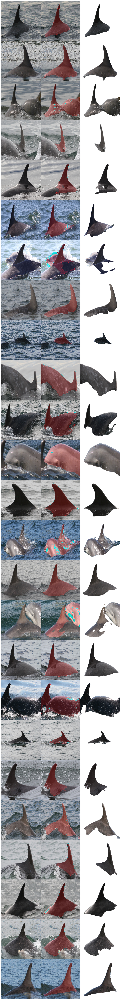

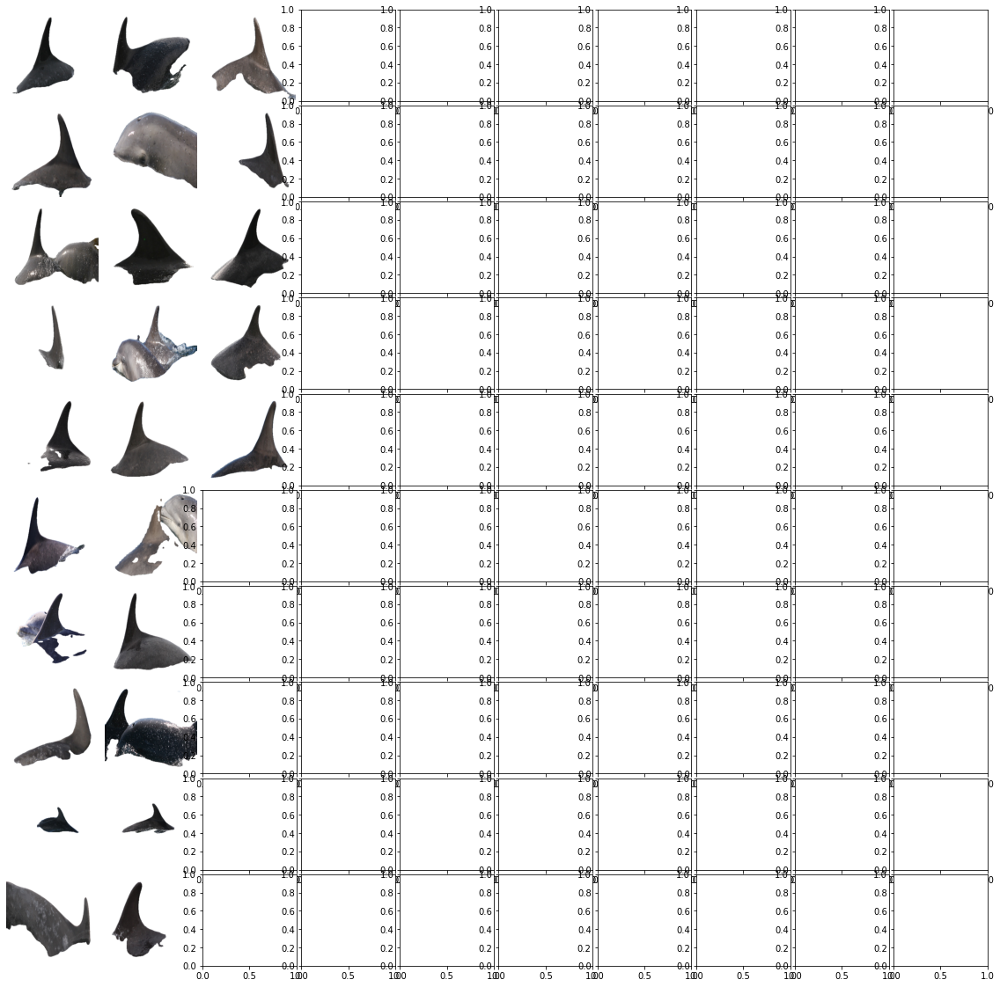

In [22]:
# fig, axes = plt.subplots(25, 1, figsize=(200,200))

# for idx, img in enumerate(img_to_draw):
#     image, im_oryg, sal_map, mask = pred_unet(net, [img_to_draw[idx]]) 
#     result = np.concatenate((im_oryg, sal_map, image), axis=1)
#     result_img = Img.fromarray(result)
#     axes[idx].axis('off')
#     axes[idx].imshow(result_img)

# plt.subplots_adjust(wspace=0.05, hspace=0)
# plt.show()


# fig, axes = plt.subplots(10, 10, figsize=(20,20))

# for idx, img in enumerate(img_to_draw):
#     i = idx % 10
#     j = idx // 10
#     image, im_oryg, sal_map, mask = pred_unet(net, [img_to_draw[idx]]) 
#     iar_shp = np.array(image).shape
#     axes[i, j].axis('off')
#     axes[i, j].imshow(image)
# #     plt.savefig(idx)
# plt.subplots_adjust(wspace=0.05, hspace=0.05)
# plt.show()

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3487: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1805: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


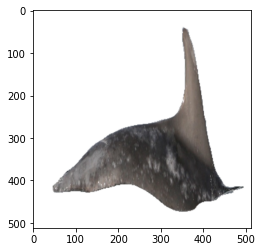

In [13]:

# remove_background_imgs
# # fig, axes = plt.subplots(2, 2, figsize=(20,20))

# for idx, img in enumerate(img_to_draw[:5]):
#     i = idx % 2
#     j = idx // 2
#     image, im_oryg, sal_map, mask = pred_unet(net, [img_to_draw[idx]]) 
# #     iar_shp = np.array(image).shape
# #     axes[i, j].axis('off')
# #     axes[i, j].imshow(image)
# #     plt.imshow(img)

# #     plt.savefig("/kaggle/working/task"+str(idx)+".jpg")
#     plt.imshow(image)
#     plt.imsave("/kaggle/working/task"+str(idx)+".jpg",image)
# #     print("task"+str(idx)+".jpg")
# # plt.subplots_adjust(wspace=0.05, hspace=0.05)
# # plt.show()

../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images/00021adfb725ed.jpg


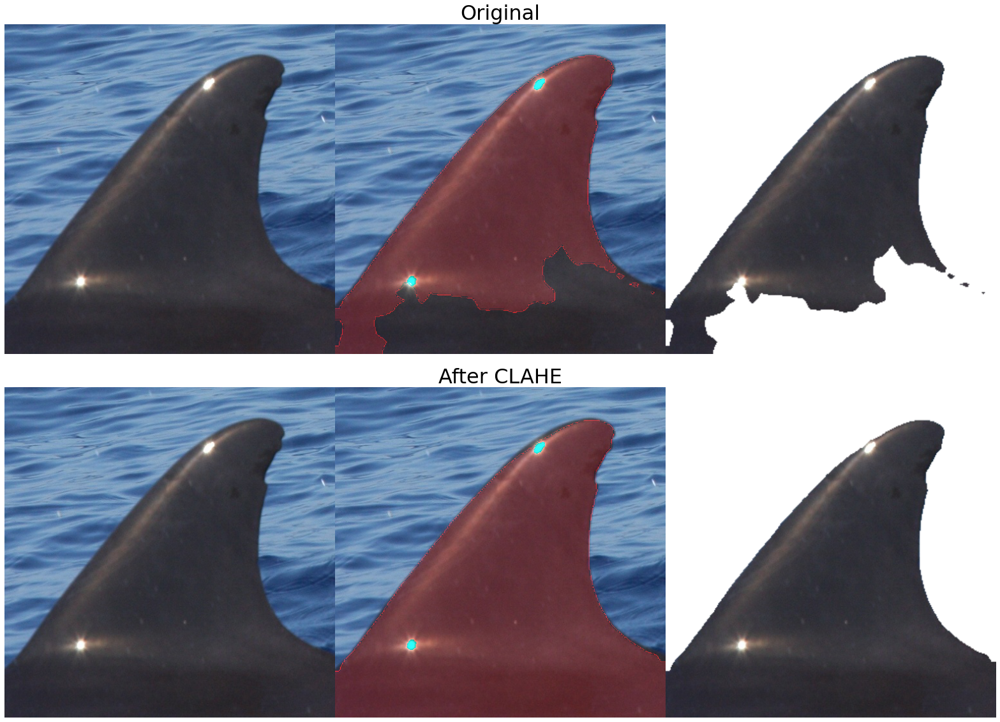

In [28]:
fig, axes = plt.subplots(2, 1, figsize=(30,20))
i_m_t = img_to_draw[0:1]
import cv2 as cv

for idx, img in enumerate(i_m_t):
    #CLAHE
    print(img)
    image, im_oryg, sal_map, mask = pred_unet(net, [i_m_t[idx]]) 
    result = np.concatenate((im_oryg, sal_map, image), axis=1)
    result_img = Img.fromarray(result)
    axes[idx].axis('off')
    axes[idx].set_title('Original', fontsize=32)
    axes[idx].imshow(result_img)
    
    
    image, im_oryg, sal_map, mask = pred_unet_CLAHE_show(net, [i_m_t[idx]]) 
    result = np.concatenate((im_oryg, sal_map, image), axis=1)
    result_img = Img.fromarray(result)
    axes[idx+1].axis('off')
    axes[idx+1].set_title('After CLAHE', fontsize=32)
    axes[idx+1].imshow(result_img)
    


plt.subplots_adjust(wspace=0.05, hspace=0.1)
plt.show()

<div class="alert alert-success" role="alert">
    I really appreciate if you suport my work. <b>Voting is more then welcome. It motivates me a lot</b> for sharing part of solution/tools you can use in this competition.
    
My other work in this competition:
    <ul>
        <li> <a href="https://www.kaggle.com/remekkinas/whales-feature-matching-loftr-kornia">Whales feature matching LoFTR - Kornia</a></li>
    </ul>
    
</div>

## 5. IDEAS FOR IMPROVEMENT

### A. REMOVE WHITE AREA OUTSIDE SAILENT MAP - PROTOTYPE
Let's find bbox for Sailent Map and remove white area outside it. This is just prototype - some code refactoring is needed. 

In [32]:
# fig, axes = plt.subplots(4, 3, figsize=(30,40))

error_list = []
for idx, img in enumerate(img_to_draw):
    try:
        img_name = img[1]
        img = img[0]
#         print(idx,img_name,img)


        image, im_oryg, sal_map, mask = pred_unet_CLAHE_show(net, [img])

        ymin = np.nonzero((mask[:] != 0).argmax(axis = 1))[0][0]
        ymax = np.nonzero((mask[:] != 0).argmax(axis = 1))[0][-1]
        xmin = np.nonzero((mask[:] != 0).argmax(axis = 0))[0][0]
        xmax = np.nonzero((mask[:] != 0).argmax(axis = 0))[0][-1]

        img = cv2.rectangle(image.copy(), (xmin, ymin), (xmax, ymax), (255,0,0), 2)

        crop_img = image[ymin:ymax, xmin:xmax]
        crop_img = cv2.resize(crop_img, (image.shape[0], image.shape[1]), interpolation = cv2.INTER_AREA)

    #     result = np.concatenate((img, crop_img), axis=1)
    #     result_img = Img.fromarray(result)

    #     axes[idx, 0].imshow(Img.fromarray(sal_map))
    #     axes[idx, 1].imshow(Img.fromarray(img))
    #     axes[idx, 2].imshow(Img.fromarray(crop_img))
        plt.imsave("./renew/train/"+img_name,crop_img)
    except:
        error_list.append([idx,img_name,img])
        print([idx,img])
        pass

# plt.subplots_adjust(wspace=0.1, hspace=0)
# plt.show()

[279, '../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images/01887df096098a.jpg']
[744, '../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images/03e02f3977ee38.jpg']
[808, '../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images/04227b1517f8b8.jpg']
[1036, '../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images/0568cabaa3e38b.jpg']
[1717, '../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images/08d1b3f936446d.jpg']
[1932, '../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images/09d88e169e2b40.jpg']
[1978, '../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images/0a08151a35099b.jpg']
[2044, '../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images/0a6330c3a25309.jpg']
[2187, '../input/whale2-cropped-dataset/cropped_train_images/cropped_train_images/0b226891b9a2f8.jpg']
[2362, '../input/whale2-cropped-dataset/cropped_train_images/cropped_train_i

In [63]:
len(error_list)

127

In [33]:
# fig, axes = plt.subplots(4, 3, figsize=(30,40))

error_list_test = []
for idx, img in enumerate(img_to_draw_test):
    try:
        img_name = img[1]
        img = img[0]
#         print(idx,img_name,img)


        image, im_oryg, sal_map, mask = pred_unet_CLAHE_show(net, [img])

        ymin = np.nonzero((mask[:] != 0).argmax(axis = 1))[0][0]
        ymax = np.nonzero((mask[:] != 0).argmax(axis = 1))[0][-1]
        xmin = np.nonzero((mask[:] != 0).argmax(axis = 0))[0][0]
        xmax = np.nonzero((mask[:] != 0).argmax(axis = 0))[0][-1]

        img = cv2.rectangle(image.copy(), (xmin, ymin), (xmax, ymax), (255,0,0), 2)

        crop_img = image[ymin:ymax, xmin:xmax]
        crop_img = cv2.resize(crop_img, (image.shape[0], image.shape[1]), interpolation = cv2.INTER_AREA)

    #     result = np.concatenate((img, crop_img), axis=1)
    #     result_img = Img.fromarray(result)

    #     axes[idx, 0].imshow(Img.fromarray(sal_map))
    #     axes[idx, 1].imshow(Img.fromarray(img))
    #     axes[idx, 2].imshow(Img.fromarray(crop_img))
        plt.imsave("./renew/test/"+img_name,crop_img)
    except:
        error_list_test.append([idx,img_name,img])
        print([idx,img_name,img])
        pass

# plt.subplots_adjust(wspace=0.1, hspace=0)
# plt.show()

[267, 'd46bbc877c0859.jpg', '../input/whale2-cropped-dataset/cropped_test_images/cropped_test_images/d46bbc877c0859.jpg']
[536, '9736c48465a6d5.jpg', '../input/whale2-cropped-dataset/cropped_test_images/cropped_test_images/9736c48465a6d5.jpg']
[973, '894b7488ed20cc.jpg', '../input/whale2-cropped-dataset/cropped_test_images/cropped_test_images/894b7488ed20cc.jpg']
[1369, 'd7b288d84de4a5.jpg', '../input/whale2-cropped-dataset/cropped_test_images/cropped_test_images/d7b288d84de4a5.jpg']
[2299, 'd445d3e6a45211.jpg', '../input/whale2-cropped-dataset/cropped_test_images/cropped_test_images/d445d3e6a45211.jpg']
[4034, '71d6498842eb47.jpg', '../input/whale2-cropped-dataset/cropped_test_images/cropped_test_images/71d6498842eb47.jpg']
[4901, '7d90e5f1fdd75f.jpg', '../input/whale2-cropped-dataset/cropped_test_images/cropped_test_images/7d90e5f1fdd75f.jpg']
[5898, '5092c5f2f62549.jpg', '../input/whale2-cropped-dataset/cropped_test_images/cropped_test_images/5092c5f2f62549.jpg']
[5910, '7e2c3b9eea1

In [36]:
len(error_list)

130

In [99]:
train_list = []
test_list = []
for i in error_list:
#     print(i[1])
    if i[1] in list(train_df.image):train_list.append(i)
    else:test_list.append(i)

In [37]:
len(error_list_test)

43

In [34]:
# list(train_df.image[:10])
train_error_df = pd.DataFrame(error_list)
train_error_df.to_csv('train_error.csv',index=False)


In [35]:
test_error_df = pd.DataFrame(error_list_test)
test_error_df.to_csv('test_error.csv',index=False)

This notebook needs some improvement:
- code refactoring - I decided to share idea as fast as possible (I have done many research to find the best SOD solution)
- model training on custom data to improve object detection prediction